# Численное моделирование маятника и визуализация фазовых портретов

1. Запрограммирую фазовые портреты маятника для разных начальных углов.
2. Визуализирую колеблющийся маятник (анимация положения маятника во времени).
3. Смоделирую систему гармонически-сопряжённых маятников — несколько маятников с разными длинами, у которых частоты соотносятся как рациональные числа.

In [1]:
import numpy as np                  
import matplotlib.pyplot as plt    
from matplotlib import animation    
from IPython.display import HTML    # Чтобы красиво выводить анимацию внутри Jupyter

# Ниже задаём физические константы маятника
g = 9.81      # ускорение свободного падения (м/с^2)
L = 1.0       # длина маятника (м) - для начала возьмём один маятник длиной 1 м
m = 1.0       # масса маятника (кг) - в модели без потерь масса не сильно важна, но оставим

# Задаём параметры интегрирования по времени
t_start = 0.0      # начальное время (сек)
t_end = 10.0       # конечное время (сек) 
dt = 0.01          # шаг по времени (сек)
N = int((t_end - t_start) / dt) + 1   # количество точек по времени

# Создаём массив времени, где будут рассчитаны углы и скорости
time = np.linspace(t_start, t_end, N)  # равномерный массив времени от t_start до t_end

In [2]:
# Функция, которая задаёт уравнения движения маятника
# Вторая производная по времени d^2θ/dt^2 + (g/L)*sin(θ) = 0
# Переписываем её как систему двух уравнений первого порядка:
# dθ/dt = ω
# dω/dt = -(g/L)*sin(θ)

def pendulum_derivatives(theta, omega, g=9.81, L=1.0):
    """
    Функция возвращает производные dθ/dt и dω/dt
    theta - угол (рад)
    omega - угловая скорость (рад/с)
    g, L - параметры маятника
    """
    dtheta_dt = omega                          # производная угла - это угловая скорость
    domega_dt = -(g / L) * np.sin(theta)       # производная угловой скорости - угловое ускорение
    return dtheta_dt, domega_dt                # возвращаем две производные

In [3]:
# Здесь напишем функцию, которая по заданным начальным условиям
# будет считать эволюцию маятника методом Рунге–Кутты 4‑го порядка (RK4)

def solve_pendulum_RK4(theta0, omega0, time, g=9.81, L=1.0):
    """
    Численно решает уравнения маятника методом Рунге-Кутты 4-го порядка.
    
    theta0 - начальный угол (рад)
    omega0 - начальная угловая скорость (рад/с)
    time - массив времени
    g, L - параметры маятника
    """
    # Сколько всего временных шагов
    N = len(time)                      # длина массива времени
    dt = time[1] - time[0]            # предполагаем, что шаг постоянный
    
    # Создаём массивы для хранения решения
    theta = np.zeros(N)               # сюда запишем угол на каждом шаге
    omega = np.zeros(N)               # сюда запишем угловую скорость
    
    # Задаём начальные условия
    theta[0] = theta0                 # угол в момент времени t[0]
    omega[0] = omega0                 # угловая скорость в момент времени t[0]
    
    # Основной цикл по времени
    for i in range(N - 1):            # идём с 0 до N-2, потому что считаем i+1
        # Текущее значение величин
        th = theta[i]                 # текущий угол
        w = omega[i]                  # текущая угловая скорость
        
        # Считаем коэффициенты k1 (первые оценки производных)
        k1_th, k1_w = pendulum_derivatives(th, w, g=g, L=L)
        
        # Считаем коэффициенты k2 (на середине шага с учётом k1)
        k2_th, k2_w = pendulum_derivatives(
            th + 0.5 * dt * k1_th,    # угол плюс половина шага по k1
            w + 0.5 * dt * k1_w,     # скорость плюс половина шага по k1
            g=g, L=L
        )
        
        # Считаем коэффициенты k3 (ещё одна точка посередине)
        k3_th, k3_w = pendulum_derivatives(
            th + 0.5 * dt * k2_th,    # угол плюс половина шага по k2
            w + 0.5 * dt * k2_w,     # скорость плюс половина шага по k2
            g=g, L=L
        )
        
        # Считаем коэффициенты k4 (на конце шага)
        k4_th, k4_w = pendulum_derivatives(
            th + dt * k3_th,          # угол в конце шага (по k3)
            w + dt * k3_w,           # скорость в конце шага (по k3)
            g=g, L=L
        )
        
        # Обновляем угол и скорость, используя взвешенную сумму коэффициентов
        theta[i + 1] = th + (dt / 6.0) * (k1_th + 2 * k2_th + 2 * k3_th + k4_th)
        omega[i + 1] = w + (dt / 6.0) * (k1_w + 2 * k2_w + 2 * k3_w + k4_w)
    
    # Возвращаем массивы с углами и скоростями
    return theta, omega

## Фазовые портреты маятника при разных начальных углах

Фазовый портрет — это график «угловая скорость ω(рад/с)» по оси Y против «угол θ(рад)» по оси X.

Я построю несколько траекторий на одном графике для разных начальных углов:
- малый угол (например, 0.1 рад),
- побольше (например, 0.5 рад),
- ещё больше (1.0 рад и 2.0 рад).

Начальную угловую скорость для простоты возьму равной нулю.

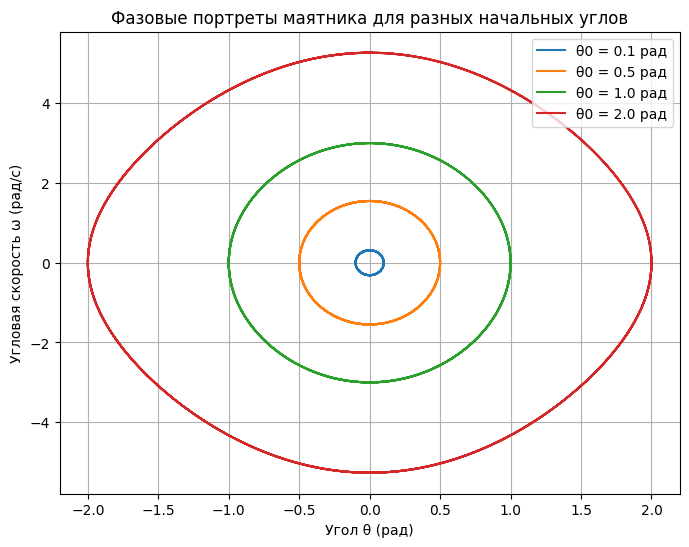

In [4]:
# Зададим список начальных углов, для которых хотим построить фазовые портреты

initial_thetas = [0.1, 0.5, 1.0, 2.0]   # разные начальные углы (в радианах)
omega0 = 0.0                            # начальная угловая скорость

# Создаём рисунок
plt.figure(figsize=(8, 6)) 

# Перебираем все начальные углы
for th0 in initial_thetas:
    # Решаем задачу для данного начального угла
    theta, omega = solve_pendulum_RK4(th0, omega0, time, g=g, L=L)
    
    # Рисуем фазовую траекторию: по оси X угол, по оси Y угловая скорость
    plt.plot(theta, omega, label=f'θ0 = {th0:.1f} рад')  

plt.xlabel('Угол θ (рад)')                 
plt.ylabel('Угловая скорость ω (рад/с)')    
plt.title('Фазовые портреты маятника для разных начальных углов')  
plt.grid(True)                              
plt.legend()                                
plt.show()                                  

## Визуализация колеблющегося маятника

Теперь сделаю простую анимацию: точка на нити двигается туда-сюда,
а параллельно можно вывести график угла или просто показать движение.

Пусть:
- длина маятника `L = 1 м`,
- начальный угол, например, `θ0 = 0.5 рад`,
- начальная скорость `ω0 = 0`.

Из угла θ(t) можно найти координаты груза:
- по X: `x = L * sin(θ)`
- по Y: `y = -L * cos(θ)` (минус, чтобы вниз было положительное направление).

In [5]:
# Задаём начальные условия для анимации
theta0_anim = 0.5       # начальный угол для анимации
omega0_anim = 0.0       # начальная угловая скорость

# Считаем эволюцию маятника методом RK4 для анимации
theta_anim, omega_anim = solve_pendulum_RK4(theta0_anim, omega0_anim, time, g=g, L=L)

# Теперь переводим углы в координаты X и Y конца маятника
x = L * np.sin(theta_anim)       # координата X конца маятника
y = -L * np.cos(theta_anim)      # координата Y конца маятника (вниз - отрицательное направление)

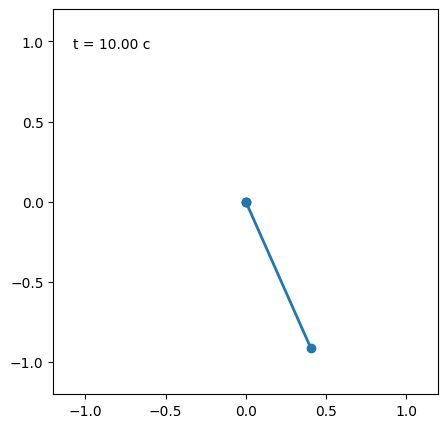

In [6]:
# Создаём фигуру и оси для анимации
fig, ax = plt.subplots(figsize=(5, 5))    

# Устанавливаем одинаковый масштаб по X и Y, чтобы маятник не "сплющивался"
ax.set_aspect('equal', adjustable='box')

# Задаём пределы по осям, чтобы маятник всегда помещался
max_len = L * 1.2                         # небольшой запас по длине
ax.set_xlim(-max_len, max_len)           # по X от -1.2L до 1.2L
ax.set_ylim(-max_len, max_len)           # по Y от -1.2L до 1.2L

# Рисуем точку крепления (верхнюю точку)
ax.plot(0, 0, 'ko')                       # маленький чёрный кружочек в начале координат

# Создаём объект для линии нити маятника
line, = ax.plot([], [], 'o-', lw=2)       # линия с точкой на конце ('o-')

# Добавим подпись времени, чтобы видеть, как оно идёт
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)  # текст в системе координат осей


def init():
    """
    Функция инициализации анимации.
    Вызывается один раз в начале.
    """
    line.set_data([], [])                # в начале линия пуста
    time_text.set_text('')               # стираем текст времени
    return line, time_text               # возвращаем объекты, которые будем анимировать


def animate(i):
    """
    Функция, которая обновляет кадр номер i.
    i - индекс кадра (шаг по времени).
    """
    # Берём координаты конца маятника для кадра i
    this_x = [0, x[i]]                   # X-координаты: сначала точка крепления (0), потом груз
    this_y = [0, y[i]]                   # Y-координаты: то же самое
    
    # Обновляем данные линии (нить + груз)
    line.set_data(this_x, this_y)        # задаём новые координаты для линии
    
    # Обновляем надпись времени в углу
    time_text.set_text(f't = {time[i]:.2f} с')   # пишем текущее время с двумя знаками после запятой
    
    # Возвращаем обновлённые объекты
    return line, time_text


# Создаём саму анимацию
ani = animation.FuncAnimation(
    fig,           # фигура для рисования
    animate,       # функция, которая рисует каждый кадр
    frames=len(time),   # сколько всего кадров (берём длину массива времени)
    init_func=init,     # функция инициализации
    interval=20,        # задержка между кадрами (мс)
    blit=True           # ускоряем анимацию за счёт перерисовки только изменённых частей
)

# Показываем анимацию в Jupyter как HTML
HTML(ani.to_jshtml())

## Система гармонически-сопряжённых маятников

Теперь смоделирую набор маятников с разными длинами так, чтобы их частоты
были связаны рациональными коэффициентами.

Для математического маятника при малых углах частота:

$\omega = \sqrt{\frac{g}{L}}$


Если взять несколько маятников с длинами $L_i$, то, чтобы отношение частот было рациональным,
можно подобрать длины по формуле:


$\omega_i : \omega_j = \sqrt{\frac{L_j}{L_i}}$

Например, чтобы $\omega_2 = 2 \omega_1$, нужно:


$2 = \sqrt{\frac{L_1}{L_2}} \Rightarrow L_2 = \frac{L_1}{4}$


Для простоты возьму:
- базовую длину $L_1 = 1.0$,
- частоты в отношениях 1 : 2 : 3,
- тогда длины будут: $L_1 = 1$, $L_2 = \frac{1}{4}$, $L_3 = \frac{1}{9}$.

Все маятники запущу с одинаковым начальным углом и нулевой начальной скоростью,
и посмотрю, как будут выглядеть их фазовые траектории и углы во времени.

In [7]:
# Задаём желаемые частотные коэффициенты (рациональные)
freq_ratios = [1, 2, 3]      # хотим, чтобы частоты были в отношении 1 : 2 : 3

# Базовая длина маятника
L_base = 1.0                 # длина первого маятника
g_const = 9.81               # ускорение свободного падения

# Теперь по формуле ω ~ sqrt(g/L) подберём длины так,
# чтобы частоты были пропорциональны freq_ratios.
# Пусть частота базы ω_base = sqrt(g/L_base).
# Тогда почти "желаемая" длина для maятника с коэффициентом k:
# ω_k = k * ω_base -> sqrt(g/L_k) = k * sqrt(g/L_base)
# => 1/sqrt(L_k) = k / sqrt(L_base)
# => L_k = L_base / k^2

lengths = []               # сюда запишем длины маятников
for k in freq_ratios:
    L_k = L_base / (k ** 2)   # длина маятника с частотой k*ω_base
    lengths.append(L_k)       # добавляем длину в список

# Посмотрим, какие длины получились
print("Длины маятников для частотных коэффициентов 1:2:3:")
for k, L_k in zip(freq_ratios, lengths):
    print(f"k = {k}, L = {L_k:.4f} м")

# Задаём одинаковые начальные условия для всех маятников
theta0_system = 0.3       # начальный угол (рад)
omega0_system = 0.0       # начальная скорость (рад/с)

# Массивы для хранения решений всех маятников
thetas_system = []        # список углов всех маятников
omegas_system = []        # список скоростей всех маятников

# Считаем решение для каждого маятника
for L_i in lengths:
    # решаем уравнения для маятника длиной L_i
    th_i, w_i = solve_pendulum_RK4(theta0_system, omega0_system, time, g=g_const, L=L_i)
    
    # сохраняем получившиеся массивы
    thetas_system.append(th_i)
    omegas_system.append(w_i)

Длины маятников для частотных коэффициентов 1:2:3:
k = 1, L = 1.0000 м
k = 2, L = 0.2500 м
k = 3, L = 0.1111 м


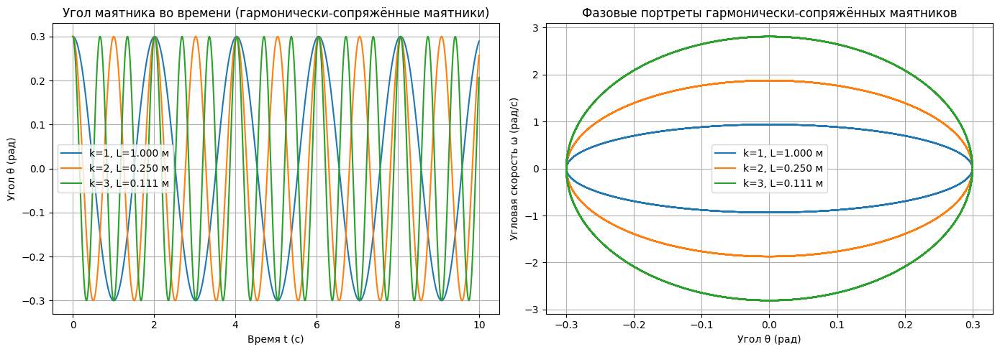

In [8]:
# Строим два графика: 
# 1) углы всех маятников как функции времени
# 2) фазовые траектории (θ, ω) для каждого маятника

plt.figure(figsize=(14, 5))

# ===== График 1: угол как функция времени =====
plt.subplot(1, 2, 1)           
for k, L_i, th_i in zip(freq_ratios, lengths, thetas_system):
    # рисуем углы для каждого маятника
    plt.plot(time, th_i, label=f'k={k}, L={L_i:.3f} м') 

plt.xlabel('Время t (с)')                      
plt.ylabel('Угол θ (рад)')                    
plt.title('Угол маятника во времени (гармонически-сопряжённые маятники)')
plt.grid(True)                                 
plt.legend()                                   

# ===== График 2: фазовые портреты =====
plt.subplot(1, 2, 2)           
for k, L_i, th_i, w_i in zip(freq_ratios, lengths, thetas_system, omegas_system):
    # рисуем фазовую траекторию
    plt.plot(th_i, w_i, label=f'k={k}, L={L_i:.3f} м')

plt.xlabel('Угол θ (рад)')                      
plt.ylabel('Угловая скорость ω (рад/с)')        
plt.title('Фазовые портреты гармонически-сопряжённых маятников')
plt.grid(True)                                  
plt.legend()                                    

plt.tight_layout()  # слегка "ужимаем" графики, чтобы не налезали надписи
plt.show()                                      